# Face Mask Detection using the EfficientDet(Inference)

### Import Libraries

In [1]:
!pip install --no-deps '../input/timm-package/timm-0.1.26-py3-none-any.whl' 
!pip install --no-deps '../input/pycocotools/pycocotools-2.0-cp37-cp37m-linux_x86_64.whl' 
!pip install effdet

Processing /kaggle/input/timm-package/timm-0.1.26-py3-none-any.whl
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
Processing /kaggle/input/pycocotools/pycocotools-2.0-cp37-cp37m-linux_x86_64.whl
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
     |████████████████████████████████| 51 kB 1.5 MB/s 
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [2]:
import sys
sys.path.insert(0, "../input/timm-efficientdet-pytorch")
sys.path.insert(0, "../input/omegaconf")
sys.path.insert(0, "../input/weightedboxesfusion")

import torch
import os
import numpy as np
import pandas as pd
from torch.utils.data import Dataset,DataLoader
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
import cv2
import gc
from matplotlib import pyplot as plt
from effdet import get_efficientdet_config, EfficientDet, DetBenchEval
from effdet.efficientdet import HeadNet

import warnings
warnings.filterwarnings('ignore')

In [3]:
test_img_all = pd.read_csv('../input/face-mask-detection-dataset/submission.csv')
test_img = pd.DataFrame(test_img_all.name.unique(),columns = ['name'])
test_img

,name
0,1800.jpg
1,1799.jpg
2,1797.jpg
3,1796.jpg
4,1795.jpg
...,...
1693,0005.jpg
1694,0004.jpg
1695,0003.jpg
1696,0002.png


In [4]:
DATA_ROOT_PATH = '../input/face-mask-detection-dataset/Medical mask/Medical mask/Medical Mask/images'

from PIL import Image

l = []
for index in range(test_img.shape[0]):
    image_id = test_img.loc[index,'name']
#     image = cv2.imread(f'{DATA_ROOT_PATH}/{image_id}', cv2.IMREAD_COLOR)
    try:
        img = Image.open(f'{DATA_ROOT_PATH}/{image_id}')
        img.verify()
    except:
        l.append(index)

test_img = test_img.drop(index = l).reset_index(drop=True)
test_img.describe()

,name
count,1698
unique,1698
top,1363.jpg
freq,1


In [5]:
def get_valid_transforms():
    return A.Compose([
            A.Resize(height=512, width=512, p=1.0),
            ToTensorV2(p=1.0),
        ], p=1.0)

In [6]:
DATA_ROOT_PATH = '../input/face-mask-detection-dataset/Medical mask/Medical mask/Medical Mask/images'

class DatasetRetriever(Dataset):

    def __init__(self, image_ids, transforms=None):
        super().__init__()
        self.image_ids = image_ids
        self.transforms = transforms

    def __getitem__(self, index: int):
        image_id = self.image_ids[index]
        image = cv2.imread(f'{DATA_ROOT_PATH}/{image_id}', cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0
        if self.transforms:
            sample = {'image': image}
            sample = self.transforms(**sample)
            image = sample['image']
        return image, image_id

    def __len__(self) -> int:
        return self.image_ids.shape[0]

In [7]:
dataset = DatasetRetriever(
    image_ids = test_img.name.values,
    transforms=get_valid_transforms()
)

def collate_fn(batch):
    return tuple(zip(*batch))

data_loader = DataLoader(
    dataset,
    batch_size=8, 
    shuffle=False,
    num_workers=4,
    drop_last=False,
    collate_fn=collate_fn
)

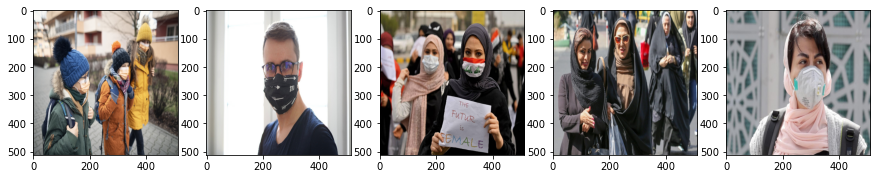

In [8]:
fig=plt.figure(figsize=(15, 15))
columns = 5
rows = 1
for i in range(1, columns*rows +1):
    image, image_id = dataset[i]
    numpy_image = image.permute(1,2,0).cpu().numpy()
    fig.add_subplot(rows, columns, i)
    plt.imshow(numpy_image)
plt.show()

In [9]:
def load_net(checkpoint_path):
    config = get_efficientdet_config('tf_efficientdet_d5')
    net = EfficientDet(config, pretrained_backbone=False)

    config.num_classes = 20
    config.image_size= 512
    net.class_net = HeadNet(config, num_outputs=config.num_classes, norm_kwargs=dict(eps=.001, momentum=.01))

    checkpoint = torch.load(checkpoint_path)
    net.load_state_dict(checkpoint['model_state_dict'])

    del checkpoint
    gc.collect()

    net = DetBenchEval(net, config)
    net.eval()
    return net.cuda()

net = load_net('../input/face-mask-detection-efficientdet-d5-training/effdet/last-checkpoint.bin')

In [10]:
def make_predictions(images, score_threshold=0.35):
    images = torch.stack(images).cuda().float()
    predictions = []
    with torch.no_grad():
        det = net(images, torch.tensor([1]*images.shape[0]).float().cuda())
        for i in range(images.shape[0]):
            boxes = det[i].detach().cpu().numpy()[:,:4]    
            scores = det[i].detach().cpu().numpy()[:,4]
            classes = det[i].detach().cpu().numpy()[:,5]
            indexes = np.where(scores > score_threshold)[0]
            boxes = boxes[indexes]
            boxes[:, 2] = boxes[:, 2] + boxes[:, 0]
            boxes[:, 3] = boxes[:, 3] + boxes[:, 1]         
            predictions.append({
                'boxes': boxes[indexes],
                'scores': scores[indexes],
                'classes': classes[indexes]
            })
    return predictions

In [11]:
import matplotlib.pyplot as plt
from tqdm import tqdm

DATA_ROOT_PATH = '../input/face-mask-detection-dataset/Medical mask/Medical mask/Medical Mask/images'

l = []
for images, image_ids in tqdm(data_loader, total = len(test_img)/data_loader.batch_size):
    all_predictions = make_predictions(images)    
    for idx, predictions in enumerate(all_predictions):
        image = cv2.imread(f'{DATA_ROOT_PATH}/{image_ids[idx]}', cv2.IMREAD_COLOR)
        for j in range (len (predictions['boxes'])):
            l.append([image_ids[idx]] + predictions['boxes'][j].tolist() + [predictions['classes'][j]] + [image.shape[0]] + [image.shape[1]]) 
            
test_result = pd.DataFrame(l,columns = ['name','x1','y1','x2','y2','class','h','w'])
test_result

213it [01:36,  2.20it/s]


,name,x1,y1,x2,y2,class,h,w
0,1800.jpg,269.377869,98.569351,465.369385,402.715820,4.0,1131,1697
1,1800.jpg,274.505219,137.250519,451.726166,301.218964,11.0,1131,1697
2,1800.jpg,271.946808,111.076195,454.362701,300.609283,10.0,1131,1697
3,1799.jpg,278.835327,138.762695,346.679626,253.916229,2.0,836,1254
4,1799.jpg,365.035553,47.314484,420.527740,162.601547,2.0,836,1254
...,...,...,...,...,...,...,...,...
6650,0003.jpg,195.538712,-3.613251,473.734436,465.641022,2.0,2002,3000
6651,0003.jpg,207.769623,202.787384,358.585785,448.677399,3.0,2002,3000
6652,0003.jpg,210.574860,147.941925,344.589142,236.489258,8.0,2002,3000
6653,0002.png,222.247833,-7.328903,411.241913,465.983459,1.0,416,740


In [12]:
test_result['x1'] = test_result['x1'].apply(lambda x1 : 0 if int(x1)<0 else x1)
test_result['y1'] = test_result['y1'].apply(lambda y1 : 0 if int(y1)<0 else y1)
test_result['x2'] = test_result['x2'].apply(lambda x2 : 512 if int(x2)>512 else x2)
test_result['y2'] = test_result['y2'].apply(lambda y2 : 512 if int(y2)>512 else y2)

# Scale coordinates
test_result['x1'] = (test_result['x1']/512.0)*test_result['w']
test_result['x2'] = (test_result['x2']/512.0)*test_result['w']
test_result['y1'] = (test_result['y1']/512.0)*test_result['h']
test_result['y2'] = (test_result['y2']/512.0)*test_result['h']

In [13]:
df = pd.read_csv('../input/face-mask-detection-efficientdet-d5-training/classname.csv')
class_map = dict(zip(list(range(1,21)),df['classname'].unique()))
test_result['classname'] = test_result['class'].apply(lambda x : class_map[x])
test_result

,name,x1,y1,x2,y2,class,h,w,classname
0,1800.jpg,892.840319,217.738157,1542.445012,889.592955,4.0,1131,1697,face_other_covering
1,1800.jpg,909.834679,303.184251,1497.225202,665.387984,11.0,1131,1697,goggles
2,1800.jpg,901.354947,245.365579,1505.963876,664.041210,10.0,1131,1697,helmet
3,1799.jpg,682.928711,226.573463,849.094241,414.597593,2.0,836,1254,face_with_mask
4,1799.jpg,894.051921,77.255680,1029.964427,265.497839,2.0,836,1254,face_with_mask
...,...,...,...,...,...,...,...,...,...
6650,0003.jpg,1145.734638,0.000000,2775.787711,1820.729151,2.0,2002,3000,face_with_mask
6651,0003.jpg,1217.400134,792.930357,2101.088583,1754.398735,3.0,2002,3000,mask_colorful
6652,0003.jpg,1233.837068,578.476043,2019.077003,924.709949,8.0,2002,3000,eyeglasses
6653,0002.png,321.217571,0.000000,594.373077,378.611561,1.0,416,740,face_no_mask


### Visualize Results

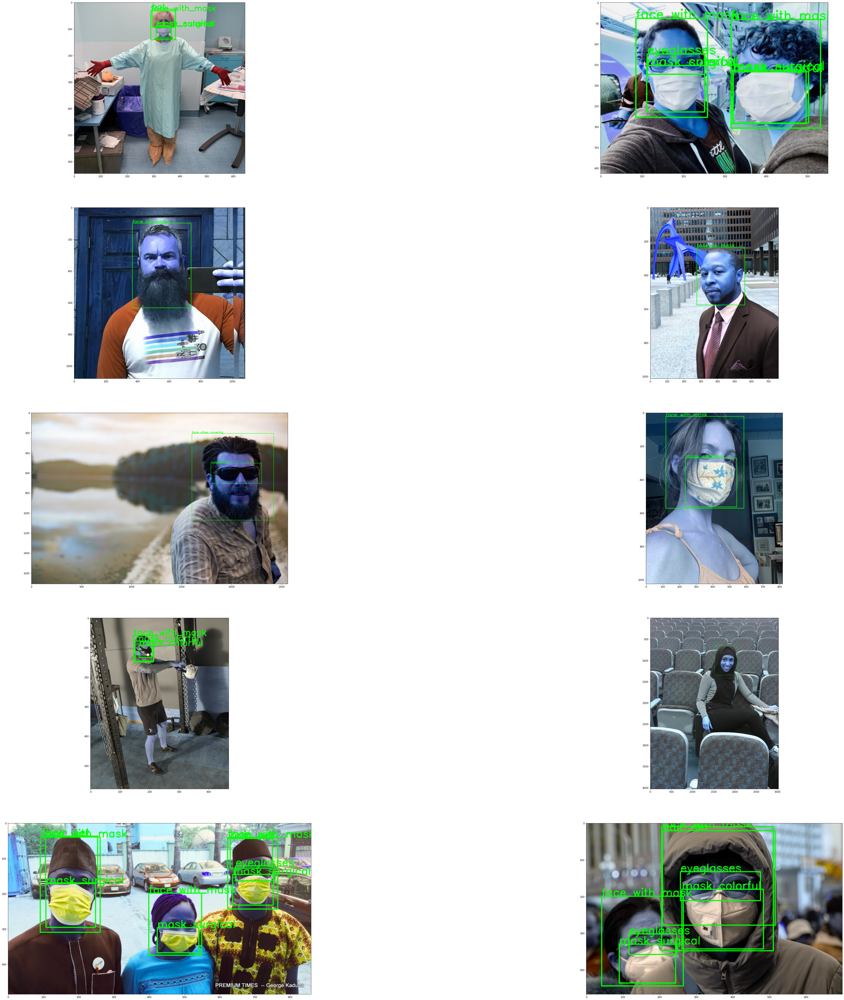

In [14]:
DATA_ROOT_PATH = '../input/face-mask-detection-dataset/Medical mask/Medical mask/Medical Mask/images'

fig=plt.figure(figsize=(75, 75))
columns = 2
rows = 5
for i in range(1, columns*rows +1):
    image_id = test_img['name'].values[i + 20]
    img = cv2.imread(f'{DATA_ROOT_PATH}/{image_id}', cv2.IMREAD_COLOR).astype(np.float32)
    img /= 255.0
#     img = cv2.resize(img, (512, 512))
    boxes = test_result[test_result['name'] == image_id][['x1','y1','x2','y2']].values.astype(np.int)
    classnames = test_result[test_result['name'] == image_id]['classname'].values
    for j,box in enumerate(boxes):
        cv2.rectangle(img, (box[0], box[1]), (box[2],  box[3]), (0 , 255, 0), 2 )
        cv2.putText(img , classnames[j] , (int(box[0]),int(box[1])), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2)
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
plt.show()